# Implementació de la GSC per a la segmentació de ferides i grapes alhora


Primer de tot, reservarem la primera cel·la de codi per a fer tots els imports necessaris. Després, ja escriurem el codi.

In [1]:
import cv2
import glob
import numpy 
import os
import skimage

import tensorflow as tf
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

from matplotlib import pyplot as plt
from numpy.random import seed
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras import backend 
from tensorflow.keras.optimizers import *
from typing import Tuple, List

os.environ["CUDA_VISIBLE_DEVICES"] = "0"
seed(1)

2024-06-30 00:35:19.554239: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1


## Lectura del *Redscar Dataset* i implementació del generador

Les imatges que s'empraran per a fer l'entrenament les anirem carregant a mesura que la xarxa les demani, per evitar carregar tot el dataset en memòria. Primer de tot, establirem la ruta del dataset.

In [2]:
REDSCAR_DATASET = "/home/marc/UIB_EXPERIMENTS/REDSCAR"
REDSCAR_ML_DATASET = os.path.join(REDSCAR_DATASET, 'SUBSETS', 'MACHINE_LEARNING_DATASET')
REDSCAR_DATASET_IMAGES = os.path.join(REDSCAR_DATASET, 'REDSCAR_DATASET', 'IMAGES')
REDSCAR_DATASET_MASKS_WOUND = os.path.join(REDSCAR_DATASET, 'REDSCAR_DATASET', 'GT_WOUND_MASK')
REDSCAR_DATASET_MASKS_STAPLE = os.path.join(REDSCAR_DATASET, 'REDSCAR_DATASET', 'GT_STAPLES_MASK')

In [3]:
# # DESCOMENTAR PER FER UNA CÀRREGA DES DE ZERO. ALTERNATIVAMENT, EMPRAR EL DATASET JA CARREGAT DINS MEMÒRIA
# def process_image(image_name: str, path: str, size: Tuple[int, int]) -> numpy.array:
#     img = cv2.imread(os.path.join(path, image_name), 1)
#     img = skimage.transform.resize(img, (size[0], size[1], 3))
#     return img

# def process_gt(image_name: str, path: str, size: Tuple[int, int]) -> numpy.array:
#     mask = cv2.imread(os.path.join(path, image_name), 0)
#     mask = cv2.resize(mask, size)

#     mask = mask/255
#     mask[mask < 0.5] = 0
#     mask[mask >= 0.5] = 1
#     return mask

# with open(os.path.join(REDSCAR_ML_DATASET, "train.txt")) as train_file:
#     TRAIN_IMAGES_NAMES = [line.rstrip() for line in train_file]
    
# with open(os.path.join(REDSCAR_ML_DATASET, "test.txt")) as test_file:
#     TEST_IMAGES_NAMES = [line.rstrip() for line in test_file]

# print("-> Loading original images on train set.")
# IMAGES_TRAIN = [process_image(image_name=image_name, path=REDSCAR_DATASET_IMAGES, size=(256, 256)) for image_name in TRAIN_IMAGES_NAMES]
# print("-> Loading original images on test set.")
# IMAGES_TEST = [process_image(image_name=image_name, path=REDSCAR_DATASET_IMAGES, size=(256, 256)) for image_name in TEST_IMAGES_NAMES]
# print("-> Loading masks for wound segmentation task on train set.")
# GROUND_TRUTHS_WOUND_TRAIN = [process_gt(image_name=image_name, path=REDSCAR_DATASET_MASKS_WOUND, size=(256, 256)) for image_name in TRAIN_IMAGES_NAMES]
# print("-> Loading masks for wound segmentation task on test set.")
# GROUND_TRUTHS_WOUND_TEST = [process_gt(image_name=image_name, path=REDSCAR_DATASET_MASKS_WOUND, size=(256, 256)) for image_name in TEST_IMAGES_NAMES]
# print("-> Loading masks for staples segmentation task on train set.")
# GROUND_TRUTHS_STAPLE_TRAIN = [process_gt(image_name=image_name, path=REDSCAR_DATASET_MASKS_STAPLE, size=(256, 256)) for image_name in TRAIN_IMAGES_NAMES]
# print("-> Loading masks for staples segmentation task on test set.")
# GROUND_TRUTHS_STAPLE_TEST = [process_gt(image_name=image_name, path=REDSCAR_DATASET_MASKS_STAPLE, size=(256, 256)) for image_name in TEST_IMAGES_NAMES]

%store -r IMAGES_TRAIN
%store -r IMAGES_TEST
%store -r IMAGES_GRAY_TRAIN
%store -r IMAGES_GRAY_TEST
%store -r GROUND_TRUTHS_WOUND_TRAIN
%store -r GROUND_TRUTHS_WOUND_TEST
%store -r GROUND_TRUTHS_STAPLE_TRAIN
%store -r GROUND_TRUTHS_STAPLE_TEST

In [4]:
def cnn_generator(images: List[numpy.array], 
                  masks_wound: List[numpy.array], 
                  masks_staple: List[numpy.array],
                  batch_size: int):
    assert (len(images)==len(masks_wound)) and (len(images)==len(masks_staple)), "The number of images and masks to be used must match." 
    batch_img = []
    batch_masks = []
    idx = 1
    
    while(True):
        batch_img.append(images[idx % len(images)])
        batch_masks.append(numpy.dstack((masks_wound[idx % len(images)], 
                                         masks_staple[idx % len(images)])))
        
        if (idx % batch_size == 0) and idx != 0:            
            batch_img = numpy.array(batch_img)
            batch_masks = numpy.array(batch_masks)
            
            yield batch_img, batch_masks
            
            batch_img = []
            batch_masks = []
        idx += 1

(5, 256, 256) (5, 256, 256, 2)


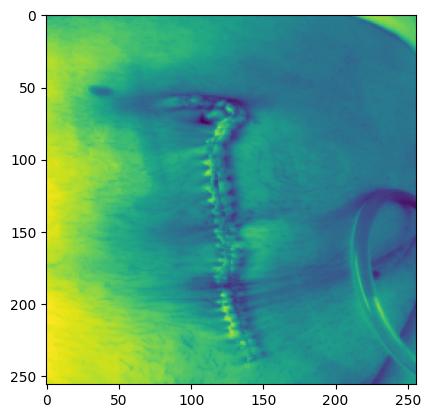

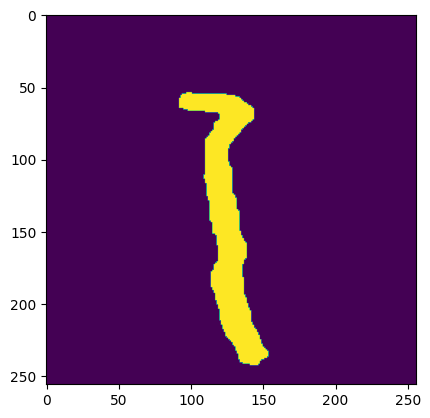

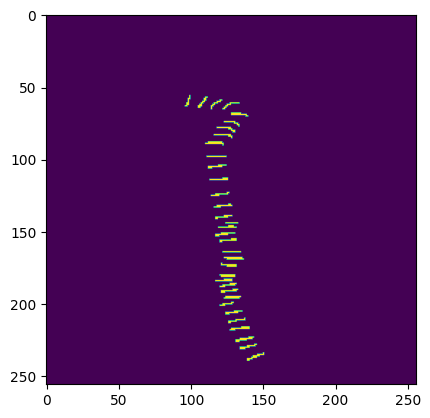

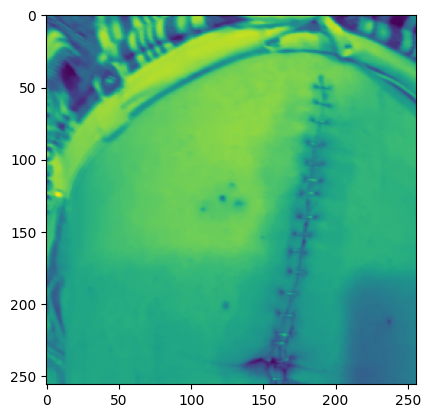

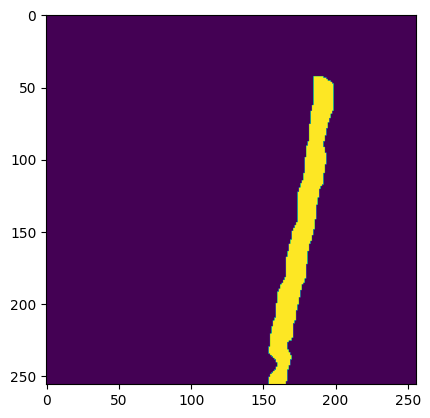

...

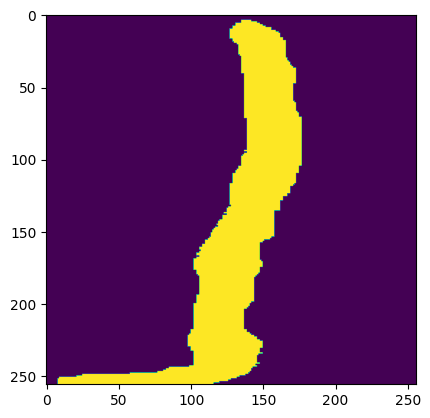

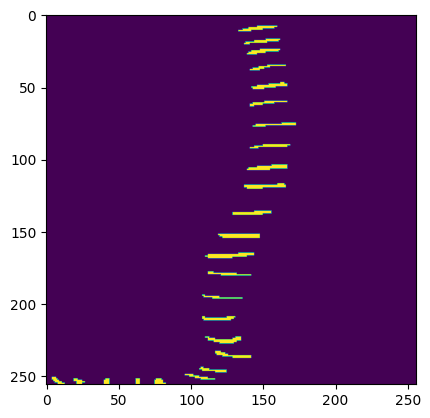

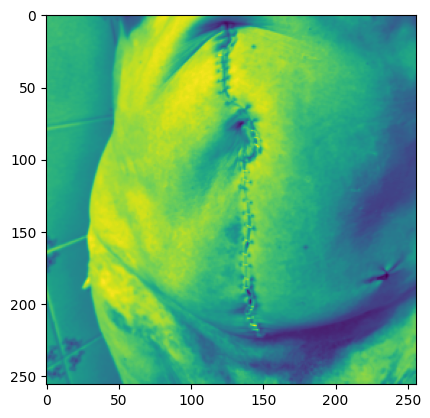

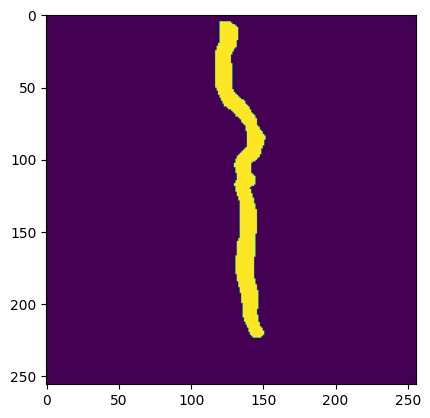

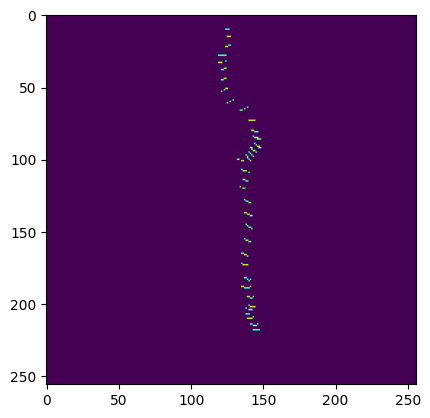

In [5]:
BATCH_SIZE = 5
for image_batch, mask_batch in cnn_generator(images=IMAGES_GRAY_TRAIN,
                                             masks_wound=GROUND_TRUTHS_WOUND_TRAIN,
                                             masks_staple=GROUND_TRUTHS_STAPLE_TRAIN,
                                             batch_size=BATCH_SIZE):
    print(image_batch.shape, mask_batch.shape)
    for i in range(0, BATCH_SIZE):
        plt.imshow(image_batch[i,:,:])
        plt.show()
        plt.imshow(mask_batch[i,:,:,0])
        plt.show()
        plt.imshow(mask_batch[i,:,:,1])
        plt.show()
    break

## Implementació de la GSC multitasca

El que farem serà implementar una funció per als blocs de codificació (els de l'esquerra), i una funció per als blocs de decodificació (els de la dreta).

In [6]:
# Idèntic a la GSC per a segmentació "simple"
def encoder_block(inputs, num_filters): 
    # el codificador és molt semblant a la UNet, esquema imatge anterior (a):    
    # Convolution with 3x3 filter followed by ReLU activation, and BN 
    x = tf.keras.layers.Conv2D(filters=num_filters, kernel_size=(3,3), padding='same', kernel_initializer='he_normal')(inputs) 
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    
    # Convolution with 3x3 filter followed by ReLU activation, and BN
    x = tf.keras.layers.Conv2D(filters=num_filters, kernel_size=(3,3), padding='same', kernel_initializer='he_normal')(x) 
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    
    # Max Pooling with 2x2 filter 
    pooling = tf.keras.layers.MaxPool2D(pool_size = (2, 2), strides = 2)(x) 
      
    return x, pooling


def decoder_block(inputs, skip_features, num_filters): 
    # esquema imatge anterior (b)
    # ConvTrans2D with 3x3 filter
    x = tf.keras.layers.Conv2DTranspose(num_filters, kernel_size=(3,3), padding = 'same', kernel_initializer = 'he_normal', strides = (2,2))(inputs)
    
    # Concanetació 
    y = tf.keras.layers.concatenate([skip_features, x]) 
    
    # Conv2D with 1x1 filter, sigmoid activation
    y = tf.keras.layers.Convolution2D(filters=num_filters, kernel_size=(1,1), activation = 'sigmoid', padding = 'same', kernel_initializer = 'he_normal')(y)
      
    # Multipliació píxel a píxel
    y = tf.keras.layers.Multiply()([skip_features, y])
    
    # Suma
    y = tf.keras.layers.Add()([y,x])
    
    # Conv2D with 3x3 filter followed by ReLU activation, and BN:
    y = tf.keras.layers.Conv2D(filters=num_filters, kernel_size=(3,3), padding='same', kernel_initializer='he_normal')(y) 
    y = tf.keras.layers.BatchNormalization()(y)
    y = tf.keras.layers.ReLU()(y)
        
    # Conv2D with 3x3 filter followed by ReLU activation, and BN:
    y = tf.keras.layers.Conv2D(filters=num_filters, kernel_size=(3,3), padding='same', kernel_initializer='he_normal')(y) 
    y = tf.keras.layers.BatchNormalization()(y)
    y = tf.keras.layers.ReLU()(y)
    
    return y

In [7]:
def build_gsc(input_shape=Tuple[int,int,int]):
    inputs = tf.keras.layers.Input(input_shape) 
      
    # Contracting path 
    c1, p1 = encoder_block(inputs, 32) 
    c2, p2 = encoder_block(p1, 64) 
    c3, p3 = encoder_block(p2, 128) 
    c4, p4 = encoder_block(p3, 256) 
    c5, p5 = encoder_block(p4, 512)
          
    # Bottleneck
    b1 = tf.keras.layers.Conv2D(filters=1024, kernel_size=(3,3), padding='same', kernel_initializer='he_normal')(p5) 
    b1 = tf.keras.layers.BatchNormalization()(b1, training=False)
    b1 = tf.keras.layers.ReLU()(b1)
        
    # Expansive path for wound
    e1 = decoder_block(b1, c5, 512) 
    e2 = decoder_block(e1, c4, 256) 
    e3 = decoder_block(e2, c3, 128) 
    e4 = decoder_block(e3, c2, 64) 
    e5 = decoder_block(e4, c1, 32)
    outputs0 = tf.keras.layers.Conv2D(filters=1, kernel_size=(1,1), activation='sigmoid', padding='same', kernel_initializer='he_normal')(e5)
    
    # Expansive path for staples
    f1 = decoder_block(b1, c5, 512) 
    f2 = decoder_block(f1, c4, 256) 
    f3 = decoder_block(f2, c3, 128) 
    f4 = decoder_block(f3, c2, 64) 
    f5 = decoder_block(f4, c1, 32)
    outputs1 = tf.keras.layers.Conv2D(filters=1, kernel_size=(1,1), activation='sigmoid', padding='same', kernel_initializer='he_normal')(f5)
          
    outputs = tf.keras.layers.concatenate([outputs0, outputs1], axis = -1) 
    
    model = tf.keras.models.Model(inputs = inputs, outputs = outputs, name = 'GSC') 
    return model

## Entrenament de la GSC:

In [8]:
def dice(y_true, y_pred):
    y_true_f = backend.flatten(y_true)
    y_pred_f = backend.flatten(y_pred)
    intersection = backend.sum(y_true_f * y_pred_f)
    return (2.* intersection+1) / (backend.sum(y_true_f) + backend.sum(y_pred_f)+1 )  
    
def dice_wound(y_true_multitask, y_pred_multitask):
    return dice(y_true_multitask[0], y_pred_multitask[0])

def dice_staple(y_true_multitask, y_pred_multitask):
    return dice(y_true_multitask[1], y_pred_multitask[1])

def dice_mean(y_true_multitask, y_pred_multitask):
    dice_f = dice_wound(y_true_multitask, y_pred_multitask)
    dice_g = dice_staple(y_true_multitask, y_pred_multitask)
    return (1/2)*(dice_f+dice_g)

def dice_loss(y_true_multitask, y_pred_multitask):
    return 1-dice_mean(y_true_multitask, y_pred_multitask)

In [9]:
# alphas = [2e-4, 3e-4, 4e-4, 5e-4, 6e-4, 7e-4, 8e-4, 7e-5, 5e-5]
# for a in alphas:
#     gsc = build_gsc(input_shape=(256, 256, 1)) # recordem que les imatges que tracta la gsc són en escala de grisos
#     #gsc.summary()
#     gsc.compile(optimizer=Adam(learning_rate = a), loss=dice_loss, metrics = [dice_mean, dice_wound, dice_staple])
    
#     BATCH_SIZE = 5
#     TOTAL_IMAGES_TRAIN = 275
#     TOTAL_IMAGES_TEST = 119
#     STEPS_PER_EPOCH = TOTAL_IMAGES_TRAIN // BATCH_SIZE 
#     VALIDATION_STEPS = TOTAL_IMAGES_TEST // BATCH_SIZE
#     EPOCHS = 70

#     reduceLROnPlat = ReduceLROnPlateau(monitor='dice_mean', factor=0.5,
#                                    patience=3,
#                                    verbose=1, mode='max', cooldown=2, min_lr=1e-7)
#     early = EarlyStopping(monitor="dice_mean",
#                       mode="max",
#                       patience=8)

#     CALLBACKS = [early, reduceLROnPlat]

#     TRAIN_GENERATOR = cnn_generator(images=IMAGES_GRAY_TRAIN,
#                                 masks_wound=GROUND_TRUTHS_WOUND_TRAIN,
#                                 masks_staple=GROUND_TRUTHS_STAPLE_TRAIN,
#                                 batch_size=BATCH_SIZE)

#     TEST_GENERATOR = cnn_generator(images=IMAGES_GRAY_TEST,
#                                masks_wound=GROUND_TRUTHS_WOUND_TEST,
#                                masks_staple=GROUND_TRUTHS_STAPLE_TEST,
#                                batch_size=BATCH_SIZE)
    
#     training_history = gsc.fit(TRAIN_GENERATOR, 
#                            validation_data=TEST_GENERATOR,
#                            epochs=EPOCHS,
#                            validation_steps=VALIDATION_STEPS,
#                            callbacks=CALLBACKS,
#                            steps_per_epoch=STEPS_PER_EPOCH)
    
#     plt.figure(figsize=(9,6), dpi= 100, facecolor='w', edgecolor='k')

#     plt.subplot(1,2,1)
#     plt.plot(training_history.history['dice_mean'])
#     plt.plot(training_history.history['val_dice_mean'])
#     plt.title('Dice evolution')
#     plt.ylabel('dice')
#     plt.xlabel('epoch')
#     plt.legend(['train', 'validation'], loc='upper left')

#     # "Loss"
#     plt.subplot(1,2,2)
#     plt.plot(training_history.history['loss'])
#     plt.plot(training_history.history['val_loss'])
#     plt.title('Model loss')
#     plt.ylabel('loss')
#     plt.xlabel('epoch')
#     plt.legend(['train', 'validation'], loc='upper left')

#     EXPERIMENT_PATH = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment02'
#     plt.savefig(EXPERIMENT_PATH+rf"/gsc_multitasca_rendiment_prova_{a}.png")
    
#     del gsc
    

## Prediccions amb la GSC

Fins ara hem implementat la GSC, l'hem entrenat i hem guardat els pesos a un fitxer per a poder fer futures prediccions. Això és el que pretenem fer en aquesta secció: passar-li una imatge a la GSC, i que ens faci la predicció. És important observar un fet: quan li passam imatges amb el generador, li estem donant amb una certa mida, i la xarxa ens torna les imatges també amb una certa mida de sortida. Però clar, no totes les imatges del dataset tenen la mateixa mida, ni tampoc tenen la mateixa mida $256\times 256$ que li imposam a la xarxa. Per aquest motiu, és important establir un criteri. Com que les màscares ens determinen la posició exacta de l'objecte, farem el següent:

1. Donada una imatge sobre la que volem fer la predicció, canviar la seva mida a la dimensió d'entrada de la xarxa.
2. Calcular la predicció del model, que ens tornarà una imatge en la dimensió de sortida del mateix. Aquesta sortida serà, **en el cas de la GSC**, una imatge amb entrades dins l'interval $[0,1]$, que podem interpretar com una imatge en escala de grisos.
3. Redimensionar aquesta sortida amb les dimensions de la imatge en qüestió.
4. Binaritzar el resultat de la passa anterior.
5. Comparar amb la màscara.

Un dubte que pot sorgir és si les passes 3 i 4 es poden permutar. La resposta és que no. Si primer binaritzam, quan facem el canvi d'escala posterior la imatge resultant **no** és, en general, binària. Hem de pensar que fer un canvi d'escala aplica per darrere una sèrie de tècniques d'interpolació, que poden donar lloc a imatges en escala de grisos, que no són comparables a la passa 4 amb la màscara final.

In [9]:
def predict_image(model: tf.keras.models.Model, model_input: Tuple[int, int], image: numpy.ndarray, binary_threshold: float=0.5):
    # PREDICCIÓ FERIDA
    resized_image = skimage.transform.resize(image, (model_input[0], model_input[1], 1)) #Passa 1
    prediction_raw = model.predict(numpy.array([resized_image])) # Passa 2
    
    # Passa 3
    prediction_0 = prediction_raw[0][:,:,0]
    prediction_resized_0 = skimage.transform.resize(prediction_0, (image.shape[0], image.shape[1]))
    prediction_binary_bool_0 = prediction_resized_0 >= binary_threshold
    prediction_binary_f = 255*prediction_binary_bool_0
    
    # PREDICCIÓ GRAPA
    prediction_1 = prediction_raw[0][:,:,1]
    prediction_resized_1 = skimage.transform.resize(prediction_1, (image.shape[0], image.shape[1]))
    prediction_binary_bool_1 = prediction_resized_1 >= binary_threshold
    prediction_binary_g = 255*prediction_binary_bool_1    
    
    return prediction_binary_f, prediction_binary_g

Ara implementarem dues funcions que reben per paràmetres la gt i la predicció i ens retornen la mètrica: la dice i la jaccard.

In [10]:
from sklearn.metrics import confusion_matrix
def metriques_absolutes(gt_image, prediction):
    (n,m) = numpy.shape(gt_image)  
    
    if (n,m) != numpy.shape(prediction): # comprovació que les mides de la imatge de la predicció i la de la gt coincideixen
        return []
    
    # si les mides coincideixen, calcularem les mètriques absolutes
    # Convert images to binary arrays
    gt_binary = numpy.asarray(gt_image).ravel()
    gt_binary = gt_binary.astype(int)
    gt_binary = 255*gt_binary
    prediction_binary = numpy.asarray(prediction).ravel()
    
    # Calculate confusion matrix
    cm = confusion_matrix(gt_binary, prediction_binary)
    if cm.shape[0] > 1 and cm.shape[1] > 1:
        tn, fp, fn, tp = confusion_matrix(gt_binary, prediction_binary).ravel()
        return [tp, fn, fp, tn]
    return [confusion_matrix(gt_binary, prediction_binary)[0]]

In [11]:
def dice_coefficient(gt_image, prediction):
    metriques = metriques_absolutes(gt_image, prediction)  
    
    if len(metriques)<=1:
        return []
    
    [tp,fn,fp,tn] = metriques
    # calculem el valor del coeficient de dice
    if (2*tp + fp + fn) == 0: #això voldria dir que tots el coefs. són TN i, per tant, ho fa bé
        dice = 1
    else:
        dice = 2*tp/(2*tp + fp + fn)
    
    return [tp,fn,fp,tn,dice]

In [12]:
# def jaccard_coefficient(gt_image, prediction):
#     metriques = metriques_absolutes(gt_image, prediction)
    
#     if metriques == []:
#         return []
    
#     [tp,fn,fp,tn] = metriques
#     # calculem el valor del coeficient de jaccard
#     if (tp + fp + fn) == 0: #com abans, la predicció és bona
#         jaccard = 1
#     else:
#         jaccard = tp/(tp + fp + fn)
    
#     return [tp,fn,fp,tn,jaccard]

Ara avaluarem les imatges de train amb ambdues mètriques:

In [14]:
import pandas as pd
# Read the .txt file into a DataFrame
path_train = os.path.join(REDSCAR_DATASET, 'SUBSETS', 'MACHINE_LEARNING_DATASET', 'train.txt')
df = pd.read_csv(path_train, header=None)

# Convert DataFrame to a flattened list
noms_train = df.values.ravel().tolist()

In [15]:
def train_eval(xarxa, alpha):
    noms_imatges = []

    dice_imatges_f = []
    jaccard_imatges_f = []
    tp_imatges_f = []
    fn_imatges_f = []
    fp_imatges_f = []
    tn_imatges_f = []

    dice_imatges_g = []
    jaccard_imatges_g = []
    tp_imatges_g = []
    fn_imatges_g = []
    fp_imatges_g = []
    tn_imatges_g = []

    dice_mean = []
    jaccard_mean = []

    for i in range(len(IMAGES_TRAIN)):
        #noms_imatges.append(noms_train[i])

        imatge = IMAGES_TRAIN[i] # en color
        gt_image_f = GROUND_TRUTHS_WOUND_TRAIN[i] # escala de grisos
        gt_image_g = GROUND_TRUTHS_STAPLE_TRAIN[i] # escala de grisos

        #feim les prediccions
        prediction_f, prediction_g = predict_image(model=xarxa, model_input=(256, 256), image=imatge)

        #avaluam amb cada mètrica
        dice_resultat_f = dice_coefficient(gt_image_f, prediction_f)
        if dice_resultat_f != []:
            # guardam els resultats de ferida
            dice_f = dice_resultat_f[-1]
            dice_imatges_f.append(dice_f)
            jaccard_f = dice_f/(2-dice_f) 
            jaccard_imatges_f.append(jaccard_f)
            tp_f = dice_resultat_f[0]
            tp_imatges_f.append(tp_f)
            fn_f = dice_resultat_f[1]
            fn_imatges_f.append(fn_f)
            fp_f = dice_resultat_f[2]
            fp_imatges_f.append(fp_f)
            tn_f = dice_resultat_f[3]
            tn_imatges_f.append(tn_f)

            # i ara, els de grapa
            dice_resultat_g = dice_coefficient(gt_image_g, prediction_g)
            if dice_resultat_g != []: 
                dice_g = dice_resultat_g[-1]
                dice_imatges_g.append(dice_g)
                jaccard_g = dice_g/(2-dice_g) 
                jaccard_imatges_g.append(jaccard_g)
                tp_g = dice_resultat_g[0]
                tp_imatges_g.append(tp_g)
                fn_g = dice_resultat_g[1]
                fn_imatges_g.append(fn_g)
                fp_g = dice_resultat_g[2]
                fp_imatges_g.append(fp_g)
                tn_g = dice_resultat_g[3]
                tn_imatges_g.append(tn_g)

                dice_m = (dice_f + dice_g)/2
                dice_mean.append(dice_m)

                jaccard_m = (jaccard_f + jaccard_g)/2
                jaccard_mean.append(jaccard_m)

            else:
                dice_imatges_g.append(None)
                jaccard_imatges_g.append(None)
                tp_imatges_g.append(None)
                fp_imatges_g.append(None)
                fn_imatges_g.append(None)
                tn_imatges_g.append(None)

                dice_mean.append(None)
                jaccard_mean.append(None)


        else:
            dice_imatges_f.append(None)
            jaccard_imatges_f.append(None)
            tp_imatges_f.append(None)
            fp_imatges_f.append(None)
            fn_imatges_f.append(None)
            tn_imatges_f.append(None)

            dice_imatges_g.append(None)
            jaccard_imatges_g.append(None)
            tp_imatges_g.append(None)
            fp_imatges_g.append(None)
            fn_imatges_g.append(None)
            tn_imatges_g.append(None)

            dice_mean.append(None)
            jaccard_mean.append(None)

    # cream un DataFrame
    gsc_train = pd.DataFrame({'NOM': noms_train, 'DICE_f': dice_imatges_f, 'JACCARD_f': jaccard_imatges_f, 'TP_f': tp_imatges_f, 'FN_f': fn_imatges_f, 'FP_f': fp_imatges_f, 'TN_f': tn_imatges_f,
                                'DICE_g': dice_imatges_g, 'JACCARD_g': jaccard_imatges_g, 'TP_g': tp_imatges_g, 'FN_g': fn_imatges_g, 'FP_g': fp_imatges_g, 'TN_g': tn_imatges_g,
                                'DICE_mean': dice_mean, 'JACCARD_mean': jaccard_mean})

    # el guardam com un arxiu .csv en la carpeta resultats
    RESULTATS_PATH = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment02'
    gsc_train.to_csv(EXPERIMENT_PATH+rf"/gsc_multitasca_train_prova_{alpha}.csv", index=False)


Farem el mateix amb les imatges de test:

In [16]:
# Read the .txt file into a DataFrame
path_test = os.path.join(REDSCAR_DATASET, 'SUBSETS', 'MACHINE_LEARNING_DATASET', 'test.txt')
df = pd.read_csv(path_test, header=None)

# Convert DataFrame to a flattened list
noms_test = df.values.ravel().tolist()

In [17]:
def test_eval(xarxa, alpha):
    noms_imatges = []

    dice_imatges_f = []
    jaccard_imatges_f = []
    tp_imatges_f = []
    fn_imatges_f = []
    fp_imatges_f = []
    tn_imatges_f = []

    dice_imatges_g = []
    jaccard_imatges_g = []
    tp_imatges_g = []
    fn_imatges_g = []
    fp_imatges_g = []
    tn_imatges_g = []

    dice_mean = []
    jaccard_mean = []

    for i in range(len(IMAGES_TEST)):
        #noms_imatges.append(noms_train[i])

        imatge = IMAGES_TEST[i] # en color
        gt_image_f = GROUND_TRUTHS_WOUND_TEST[i] # escala de grisos
        gt_image_g = GROUND_TRUTHS_STAPLE_TEST[i] # escala de grisos

        #feim les prediccions
        prediction_f, prediction_g = predict_image(model=xarxa, model_input=(256, 256), image=imatge)

        #avaluam amb cada mètrica
        dice_resultat_f = dice_coefficient(gt_image_f, prediction_f)
        if dice_resultat_f != []:
            # guardam els resultats de ferida
            dice_f = dice_resultat_f[-1]
            dice_imatges_f.append(dice_f)
            jaccard_f = dice_f/(2-dice_f) 
            jaccard_imatges_f.append(jaccard_f)
            tp_f = dice_resultat_f[0]
            tp_imatges_f.append(tp_f)
            fn_f = dice_resultat_f[1]
            fn_imatges_f.append(fn_f)
            fp_f = dice_resultat_f[2]
            fp_imatges_f.append(fp_f)
            tn_f = dice_resultat_f[3]
            tn_imatges_f.append(tn_f)

            # i ara, els de grapa
            dice_resultat_g = dice_coefficient(gt_image_g, prediction_g)
            if dice_resultat_g != []: 
                dice_g = dice_resultat_g[-1]
                dice_imatges_g.append(dice_g)
                jaccard_g = dice_g/(2-dice_g) 
                jaccard_imatges_g.append(jaccard_g)
                tp_g = dice_resultat_g[0]
                tp_imatges_g.append(tp_g)
                fn_g = dice_resultat_g[1]
                fn_imatges_g.append(fn_g)
                fp_g = dice_resultat_g[2]
                fp_imatges_g.append(fp_g)
                tn_g = dice_resultat_g[3]
                tn_imatges_g.append(tn_g)

                dice_m = (dice_f + dice_g)/2
                dice_mean.append(dice_m)

                jaccard_m = (jaccard_f + jaccard_g)/2
                jaccard_mean.append(jaccard_m)

            else:
                dice_imatges_g.append(None)
                jaccard_imatges_g.append(None)
                tp_imatges_g.append(None)
                fp_imatges_g.append(None)
                fn_imatges_g.append(None)
                tn_imatges_g.append(None)

                dice_mean.append(None)
                jaccard_mean.append(None)


        else:
            dice_imatges_f.append(None)
            jaccard_imatges_f.append(None)
            tp_imatges_f.append(None)
            fp_imatges_f.append(None)
            fn_imatges_f.append(None)
            tn_imatges_f.append(None)

            dice_imatges_g.append(None)
            jaccard_imatges_g.append(None)
            tp_imatges_g.append(None)
            fp_imatges_g.append(None)
            fn_imatges_g.append(None)
            tn_imatges_g.append(None)

            dice_mean.append(None)
            jaccard_mean.append(None)

    # cream un DataFrame
    gsc_test = pd.DataFrame({'NOM': noms_test, 'DICE_f': dice_imatges_f, 'JACCARD_f': jaccard_imatges_f, 'TP_f': tp_imatges_f, 'FN_f': fn_imatges_f, 'FP_f': fp_imatges_f, 'TN_f': tn_imatges_f,
                                'DICE_g': dice_imatges_g, 'JACCARD_g': jaccard_imatges_g, 'TP_g': tp_imatges_g, 'FN_g': fn_imatges_g, 'FP_g': fp_imatges_g, 'TN_g': tn_imatges_g,
                                'DICE_mean': dice_mean, 'JACCARD_mean': jaccard_mean})

    # el guardam com un arxiu .csv en la carpeta resultats
    RESULTATS_PATH = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment02'
    gsc_test.to_csv(EXPERIMENT_PATH+rf"/gsc_multitasca_test_prova_{alpha}.csv", index=False)


Encara així, farem algunes proves més:

In [ ]:
dubtosos = [3e-4, 4e-4, 5e-4,  8e-4]
for d in dubtosos:
    # primer, cal inicialitzar la xarxa i entrenar-la amb els nous paràmetres:
    gsc = build_gsc(input_shape=(256, 256, 1))
    gsc.compile(optimizer=Adam(learning_rate = d), loss=dice_loss, metrics = [dice_mean, dice_wound, dice_staple])
    
    BATCH_SIZE = 5
    TOTAL_IMAGES_TRAIN = 275
    TOTAL_IMAGES_TEST = 119
    STEPS_PER_EPOCH = TOTAL_IMAGES_TRAIN // BATCH_SIZE 
    VALIDATION_STEPS = TOTAL_IMAGES_TEST // BATCH_SIZE
    EPOCHS = 50
    
    reduceLROnPlat = ReduceLROnPlateau(monitor='dice_mean', factor=0.5,
                                   patience=3,
                                   verbose=1, mode='max', cooldown=2, min_lr=1e-7)
    early = EarlyStopping(monitor="dice_mean",
                      mode="max",
                      patience=8)

    CALLBACKS = [early, reduceLROnPlat]

    TRAIN_GENERATOR = cnn_generator(images=IMAGES_GRAY_TRAIN,
                                masks_wound=GROUND_TRUTHS_WOUND_TRAIN,
                                masks_staple=GROUND_TRUTHS_STAPLE_TRAIN,
                                batch_size=BATCH_SIZE)

    TEST_GENERATOR = cnn_generator(images=IMAGES_GRAY_TEST,
                               masks_wound=GROUND_TRUTHS_WOUND_TEST,
                               masks_staple=GROUND_TRUTHS_STAPLE_TEST,
                               batch_size=BATCH_SIZE)
    
    training_history = gsc.fit(TRAIN_GENERATOR, 
                           validation_data=TEST_GENERATOR,
                           epochs=EPOCHS,
                           validation_steps=VALIDATION_STEPS,
                           callbacks=CALLBACKS,
                           steps_per_epoch=STEPS_PER_EPOCH)
    
    plt.figure(figsize=(9,6), dpi= 100, facecolor='w', edgecolor='k')

    plt.subplot(1,2,1)
    plt.plot(training_history.history['dice_mean'])
    plt.plot(training_history.history['val_dice_mean'])
    plt.title('Dice evolution')
    plt.ylabel('dice')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')

    # "Loss"
    plt.subplot(1,2,2)
    plt.plot(training_history.history['loss'])
    plt.plot(training_history.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')

    EXPERIMENT_PATH = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment02'
    plt.savefig(EXPERIMENT_PATH+rf"/gsc_multitasca_rendiment_prova2_{d}.png")
    
    # ara, avaluem-la:
    train_eval(gsc, d)
    test_eval(gsc, d)
    
    # en darrer lloc, cal esborrar-la 
    del gsc

2024-06-05 13:32:22.129504: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2024-06-05 13:32:22.173409: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:06:00.0 name: GeForce GTX 1080 Ti computeCapability: 6.1
coreClock: 1.582GHz coreCount: 28 deviceMemorySize: 10.92GiB deviceMemoryBandwidth: 451.17GiB/s
2024-06-05 13:32:22.173477: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2024-06-05 13:32:22.176327: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcublas.so.10
2024-06-05 13:32:22.178613: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcufft.so.10
2024-06-05 13:32:22.179093: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcurand.so

Epoch 1/50


2024-06-05 13:32:27.769250: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudnn.so.7
2024-06-05 13:32:28.649345: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcublas.so.10


55/55 [==============================] - 10s 182ms/step - loss: 0.8242 - dice_mean: 0.1758 - dice_wound: 0.1700 - dice_staple: 0.1816 - val_loss: 0.9385 - val_dice_mean: 0.0615 - val_dice_wound: 0.0564 - val_dice_staple: 0.0665
Epoch 2/50
55/55 [==============================] - 9s 168ms/step - loss: 0.7349 - dice_mean: 0.2651 - dice_wound: 0.2573 - dice_staple: 0.2730 - val_loss: 0.9268 - val_dice_mean: 0.0732 - val_dice_wound: 0.0665 - val_dice_staple: 0.0798
Epoch 3/50
55/55 [==============================] - 9s 168ms/step - loss: 0.6863 - dice_mean: 0.3137 - dice_wound: 0.3026 - dice_staple: 0.3248 - val_loss: 0.8956 - val_dice_mean: 0.1044 - val_dice_wound: 0.1207 - val_dice_staple: 0.0880
Epoch 4/50
55/55 [==============================] - 9s 169ms/step - loss: 0.6393 - dice_mean: 0.3607 - dice_wound: 0.3533 - dice_staple: 0.3681 - val_loss: 0.7965 - val_dice_mean: 0.2035 - val_dice_wound: 0.2148 - val_dice_staple: 0.1923
Epoch 5/50
55/55 [==============================] - 9s 168

55/55 [==============================] - 9s 171ms/step - loss: 0.2407 - dice_mean: 0.7593 - dice_wound: 0.7525 - dice_staple: 0.7661 - val_loss: 0.2685 - val_dice_mean: 0.7315 - val_dice_wound: 0.7527 - val_dice_staple: 0.7104
Epoch 19/50
55/55 [==============================] - 9s 172ms/step - loss: 0.2229 - dice_mean: 0.7771 - dice_wound: 0.7678 - dice_staple: 0.7863 - val_loss: 0.2965 - val_dice_mean: 0.7035 - val_dice_wound: 0.7280 - val_dice_staple: 0.6790
Epoch 20/50
55/55 [==============================] - 10s 175ms/step - loss: 0.2167 - dice_mean: 0.7833 - dice_wound: 0.7743 - dice_staple: 0.7924 - val_loss: 0.8530 - val_dice_mean: 0.1470 - val_dice_wound: 0.1632 - val_dice_staple: 0.1308
Epoch 21/50
55/55 [==============================] - 9s 171ms/step - loss: 0.2126 - dice_mean: 0.7874 - dice_wound: 0.7760 - dice_staple: 0.7989 - val_loss: 0.6472 - val_dice_mean: 0.3528 - val_dice_wound: 0.3564 - val_dice_staple: 0.3492
Epoch 22/50
55/55 [==============================] - 10

Ara sí, concloem que la configuració amb millor rendiment és la següent:

2024-06-30 00:35:43.528852: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2024-06-30 00:35:43.555024: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:05:00.0 name: GeForce GTX 1080 Ti computeCapability: 6.1
coreClock: 1.582GHz coreCount: 28 deviceMemorySize: 10.91GiB deviceMemoryBandwidth: 451.17GiB/s
2024-06-30 00:35:43.555063: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2024-06-30 00:35:43.556664: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcublas.so.10
2024-06-30 00:35:43.557989: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcufft.so.10
2024-06-30 00:35:43.558225: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcurand.so

Epoch 1/50


2024-06-30 00:35:48.626236: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudnn.so.7
2024-06-30 00:35:49.431092: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcublas.so.10


55/55 [==============================] - 10s 182ms/step - loss: 0.8238 - dice_mean: 0.1762 - dice_wound: 0.1696 - dice_staple: 0.1828 - val_loss: 0.9386 - val_dice_mean: 0.0614 - val_dice_wound: 0.0561 - val_dice_staple: 0.0668
Epoch 2/50
55/55 [==============================] - 9s 168ms/step - loss: 0.7414 - dice_mean: 0.2586 - dice_wound: 0.2440 - dice_staple: 0.2732 - val_loss: 0.9260 - val_dice_mean: 0.0740 - val_dice_wound: 0.0671 - val_dice_staple: 0.0809
Epoch 3/50
55/55 [==============================] - 9s 168ms/step - loss: 0.6696 - dice_mean: 0.3304 - dice_wound: 0.3250 - dice_staple: 0.3357 - val_loss: 0.9256 - val_dice_mean: 0.0744 - val_dice_wound: 0.0843 - val_dice_staple: 0.0645
Epoch 4/50
55/55 [==============================] - 9s 169ms/step - loss: 0.6051 - dice_mean: 0.3949 - dice_wound: 0.3890 - dice_staple: 0.4009 - val_loss: 0.9227 - val_dice_mean: 0.0773 - val_dice_wound: 0.0813 - val_dice_staple: 0.0733
Epoch 5/50
55/55 [==============================] - 9s 169

55/55 [==============================] - 10s 176ms/step - loss: 0.1488 - dice_mean: 0.8512 - dice_wound: 0.8450 - dice_staple: 0.8574 - val_loss: 0.2749 - val_dice_mean: 0.7251 - val_dice_wound: 0.7377 - val_dice_staple: 0.7126
Epoch 35/50
55/55 [==============================] - 10s 177ms/step - loss: 0.1407 - dice_mean: 0.8593 - dice_wound: 0.8559 - dice_staple: 0.8626 - val_loss: 0.2935 - val_dice_mean: 0.7065 - val_dice_wound: 0.7043 - val_dice_staple: 0.7086
Epoch 36/50
55/55 [==============================] - 10s 174ms/step - loss: 0.1407 - dice_mean: 0.8593 - dice_wound: 0.8535 - dice_staple: 0.8652 - val_loss: 0.2773 - val_dice_mean: 0.7227 - val_dice_wound: 0.7096 - val_dice_staple: 0.7359
Epoch 37/50
55/55 [==============================] - 9s 173ms/step - loss: 0.1360 - dice_mean: 0.8640 - dice_wound: 0.8588 - dice_staple: 0.8692 - val_loss: 0.2377 - val_dice_mean: 0.7623 - val_dice_wound: 0.7260 - val_dice_staple: 0.7986
Epoch 38/50
55/55 [==============================] - 

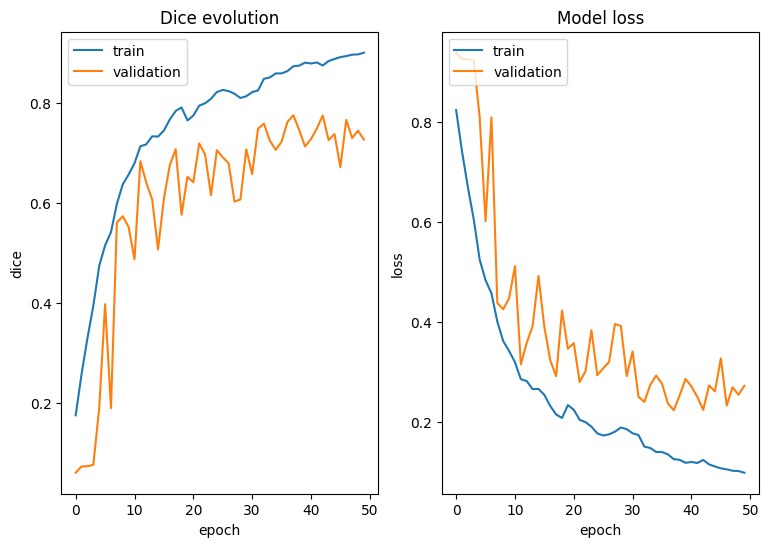

In [13]:
gsc = build_gsc(input_shape=(256, 256, 1))
gsc.compile(optimizer=Adam(learning_rate = 4e-4), loss=dice_loss, metrics = [dice_mean, dice_wound, dice_staple])

BATCH_SIZE = 5
TOTAL_IMAGES_TRAIN = 275
TOTAL_IMAGES_TEST = 119
STEPS_PER_EPOCH = TOTAL_IMAGES_TRAIN // BATCH_SIZE 
VALIDATION_STEPS = TOTAL_IMAGES_TEST // BATCH_SIZE
EPOCHS = 50

reduceLROnPlat = ReduceLROnPlateau(monitor='dice_mean', factor=0.5,
                               patience=3,
                               verbose=1, mode='max', cooldown=2, min_lr=1e-7)
early = EarlyStopping(monitor="dice_mean",
                  mode="max",
                  patience=8)

CALLBACKS = [early, reduceLROnPlat]

TRAIN_GENERATOR = cnn_generator(images=IMAGES_GRAY_TRAIN,
                            masks_wound=GROUND_TRUTHS_WOUND_TRAIN,
                            masks_staple=GROUND_TRUTHS_STAPLE_TRAIN,
                            batch_size=BATCH_SIZE)

TEST_GENERATOR = cnn_generator(images=IMAGES_GRAY_TEST,
                           masks_wound=GROUND_TRUTHS_WOUND_TEST,
                           masks_staple=GROUND_TRUTHS_STAPLE_TEST,
                           batch_size=BATCH_SIZE)

training_history = gsc.fit(TRAIN_GENERATOR, 
                       validation_data=TEST_GENERATOR,
                       epochs=EPOCHS,
                       validation_steps=VALIDATION_STEPS,
                       callbacks=CALLBACKS,
                       steps_per_epoch=STEPS_PER_EPOCH)

plt.figure(figsize=(9,6), dpi= 100, facecolor='w', edgecolor='k')

plt.subplot(1,2,1)
plt.plot(training_history.history['dice_mean'])
plt.plot(training_history.history['val_dice_mean'])
plt.title('Dice evolution')
plt.ylabel('dice')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')

# "Loss"
plt.subplot(1,2,2)
plt.plot(training_history.history['loss'])
plt.plot(training_history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')

EXPERIMENT_PATH = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment02'
plt.savefig(EXPERIMENT_PATH+rf"/gsc_multitasca_rendiment.png")

In [14]:
# guardam el model
EXPERIMENT_PATH = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment02'
gsc.save(os.path.join(EXPERIMENT_PATH, "gsc_multitasca.h5"))

## Algunes prediccions:
Per a poder veure com de bé ho fa la xarxa GSC, guardarem algunes prediccions. 

Ara implementarem diverses funcions per a obtenir visualitzacions dels resultats

In [15]:
# funció ppal que cridarà a les altres:
def visualitzacions(model, noms_imatges: list, ruta_imatges: str, rutes_gt: list, input_size: int, ruta_guardar: str, titol: str):
    k = 1 
    for nom in noms_imatges:
        if nom.endswith('resolution=1.png'):
            qualitat = 1
        else:
            qualitat = 0
        # carregam la imatge, les gts i feim les prediccions
        imatge = cv2.imread(os.path.join(ruta_imatges, nom), 1) # en color
        gt_f = cv2.imread(os.path.join(rutes_gt[0], nom), 0) # escala de grisos
        gt_g = cv2.imread(os.path.join(rutes_gt[1], nom), 0) # escala de grisos
        prediccio_f, prediccio_g = predict_image(model=model, model_input=(input_size, input_size), image=imatge)
        
        # cridam a la funció que dibuixa les prediccions sobre la imatge original
        res1_f = mascara(imatge,prediccio_f)
        cv2.imwrite(ruta_guardar+rf"/{titol}_{k}_mascara_f.png", res1_f)
        res1_g = mascara(imatge,prediccio_g)
        cv2.imwrite(ruta_guardar+rf"/{titol}_{k}_mascara_g.png", res1_g)
        
        # cridam a la funció que dibuixa els contorns de la predicció i de la gt sobre la imatge original
        res2_f = contorns(imatge, prediccio_f, gt_f, qualitat)
        cv2.imwrite(ruta_guardar+rf"/{titol}_{k}_contorns_f.png", res2_f)
        plt.imshow(res2_f)
        plt.show()
        
        res2_g = contorns(imatge, prediccio_g, gt_g, qualitat)
        cv2.imwrite(ruta_guardar+rf"/{titol}_{k}_contorns_g.png", res2_g)
        plt.imshow(res2_g)
        plt.show()
        
        k += 1

In [16]:
# funció auxiliar que dibuixa la predicció sobre la imatge original:
def mascara(imatge, prediccio):
    mascara = imatge.copy()
    for i in range(imatge.shape[0]):
        for j in range(imatge.shape[1]):
            if prediccio[i, j] > 0:  
                mascara[i, j] = [107,183,189]  # Paint in yellow
    return mascara    

In [33]:
# funció auxiliar que dibuixa els contorns de la gt i de la prediccio sobre la imatge original:
# color gt = green; color prediccio = red
def contorns(imatge, prediccio, gt, qualitat):
    resultat = imatge.copy()
    # PREDICCIO
    # gray = cv2.cvtColor(prediccio, cv2.COLOR_BGR2GRAY) 
    # find contours with hierarchy
    contours, hier = cv2.findContours(prediccio.astype(numpy.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
                                                # how the contours are retrieved and organized, contour approximation method
    # Define sufficient enough colors for blobs (taques)
    colors = [(0, 255, 0), (0, 0, 255)] # green and red (BGR format)
    k = -1
    for i, cnt in enumerate(contours):
        if (hier[0, i, 3] == -1):  # Check if the current contour has no parent, i.e., the contour is an external contour
            k += 1
        if qualitat == 1:
            cv2.drawContours(resultat, [cnt], -1, colors[1], 5) #pintam la predicció de vermell
        else:
            cv2.drawContours(resultat, [cnt], -1, colors[1], 1) #pintam la predicció de vermell

        
    # GT
    # find contours with hierarchy
    contours, hier = cv2.findContours(gt, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
                                                # how the contours are retrieved and organized, contour approximation method
    k = -1
    for i, cnt in enumerate(contours):
        if (hier[0, i, 3] == -1):  # Check if the current contour has no parent, i.e., the contour is an external contour
            k += 1
        if qualitat == 1:
            cv2.drawContours(resultat, [cnt], -1, colors[0], 5) #pintam la gt de verd
        else:
            cv2.drawContours(resultat, [cnt], -1, colors[0], 1) #pintam la gt de verd
          
    return resultat

Ara sí, dibuixem les prediccions i guardem els resultats

## Filtratge 1: millors i pitjors imatges d'alta resolució

In [19]:
#carregam el df
# carregam el data frame de test:
import pandas as pd
df = pd.read_csv('/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment02/gsc_multitasca_test_prova_0.0004.csv')

# filtram les imatges d'alta resolució -> df1:
df1 = df[df['NOM'].str.endswith('resolution=1.png')]

# eliminam les que NO tenen cap grapa
noms_sense = ['qfBqdnHgJkPwfL4apJ8o2N4na_infection=0_capture=1_resolution=1.png',
              'KnclSSvSGyJt26zuAelrcgQ6b_infection=0_capture=1_resolution=1.png',
             'djnIcpMtGUmA2PAxIYTDpdD9y_infection=0_capture=1_resolution=1.png',
             'YzLNpYW33lmFgkqNRUKgIzj1J_infection=0_capture=1_resolution=1.png']
df1 = df1[~df1['NOM'].isin(noms_sense)].reset_index(drop=True)

# l'ordenam en funció del coeficient dice
df1_sorted = df1.sort_values(by='DICE_mean',ascending=False).reset_index(drop=True)# ordenem el df de major a menor coef. de dice
                                                       # per a accedir més fàcilment a les imatges que volem seleccionar

print(df1_sorted)

                                                  NOM    DICE_f  JACCARD_f  \
0   mYK7RLzwiniuS242ozwJGMnVp_infection=0_capture=...  0.924759   0.860048   
1   XFTnygo35Pqz4remF7QvNtYPs_infection=0_capture=...  0.868268   0.767202   
2   8piW6sYXVXcnN0wrTngX8mo5K_infection=1_capture=...  0.820385   0.695468   
3   y0fDhNsqek7URHWZxLAskDYFw_infection=0_capture=...  0.903646   0.824228   
4   c333lDWLYrwrLnm638Bhx9UiW_infection=0_capture=...  0.904171   0.825102   
..                                                ...       ...        ...   
61  OBdZZnNB0ujS5AR5scofFIPjq_infection=0_capture=...  0.718163   0.560261   
62  RkD87UBnT8JZWcIj3DpAjGGa1_infection=0_capture=...  0.622486   0.451891   
63  i2FEPjRuOM8fuErpME1PGXJbp_infection=0_capture=...  0.800000   0.666667   
64  iCu5nHJ3xLx4K2qWYbG3dOEPo_infection=0_capture=...  0.681759   0.517173   
65  AAb0Z0BZMuyDQL1tQLRrCnAwb_infection=1_capture=...  0.298683   0.175560   

    TP_f  FN_f  FP_f   TN_f    DICE_g  JACCARD_g   TP_g   FN_g 

In [20]:
nom_tots = []
dice_tots = []

# seleccionam les 10 millors
nom_millors = []
for i in range(10):
    nom = df1_sorted.loc[i,"NOM"]
    nom_millors.append(nom)
    nom_tots.append(nom)
    dice_tots.append(df1_sorted.loc[i,"DICE_mean"])
    
# seleccionam les 5 pitjors
nom_pitjors = []
n = df1_sorted.shape[0]
# iteram a les 5 darreres files
for i in range(n-5,n):
    nom = df1_sorted.loc[i,"NOM"]
    dice_value = df1_sorted.loc[i,"DICE_mean"]
    nom_pitjors.append(nom)
    nom_tots.append(nom)
    dice_tots.append(dice_value)
#print(nom_millors)
print(nom_tots) 
print(dice_tots)
resultats_gsc_alta = pd.DataFrame({'NOM':nom_tots, 'DICE':dice_tots})
# el guardam com un arxiu .csv en la carpeta resultats
RESULTATS_PATH = '/home/marc/ANGELS_EXPERIMENTS/Results/Experiment28/gsc_multitasca_resultats_alta.csv'
resultats_gsc_alta.to_csv(RESULTATS_PATH, index=False)


['mYK7RLzwiniuS242ozwJGMnVp_infection=0_capture=1_resolution=1.png', 'XFTnygo35Pqz4remF7QvNtYPs_infection=0_capture=1_resolution=1.png', '8piW6sYXVXcnN0wrTngX8mo5K_infection=1_capture=1_resolution=1.png', 'y0fDhNsqek7URHWZxLAskDYFw_infection=0_capture=1_resolution=1.png', 'c333lDWLYrwrLnm638Bhx9UiW_infection=0_capture=1_resolution=1.png', '1Nt2Dcn2ztA8EIzggVYdBkhTb_infection=0_capture=1_resolution=1.png', '3DCYh9WC6Es11DJ1c3HC07mzZ_infection=0_capture=1_resolution=1.png', 'oQrkfllb3QxLOseOZi06yDus4_infection=0_capture=1_resolution=1.png', 'ryKjQSSENOdxC3TMnxV622ENQ_infection=0_capture=1_resolution=1.png', 'xeOwVoGtlcLy44Z1tjQ7zcaKd_infection=1_capture=1_resolution=1.png', 'OBdZZnNB0ujS5AR5scofFIPjq_infection=0_capture=1_resolution=1.png', 'RkD87UBnT8JZWcIj3DpAjGGa1_infection=0_capture=1_resolution=1.png', 'i2FEPjRuOM8fuErpME1PGXJbp_infection=0_capture=1_resolution=1.png', 'iCu5nHJ3xLx4K2qWYbG3dOEPo_infection=0_capture=1_resolution=1.png', 'AAb0Z0BZMuyDQL1tQLRrCnAwb_infection=1_capture=

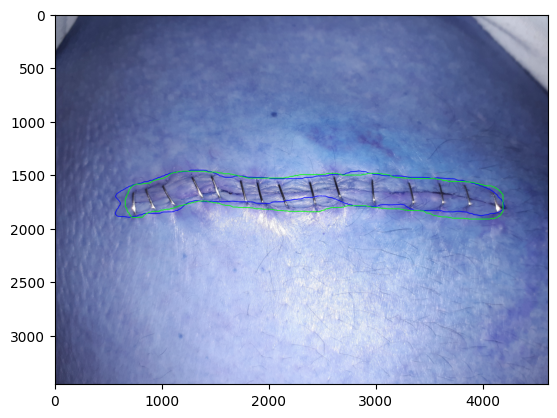

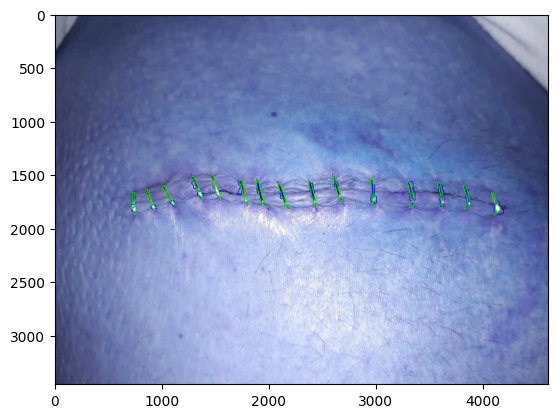

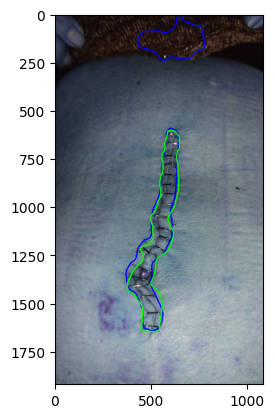

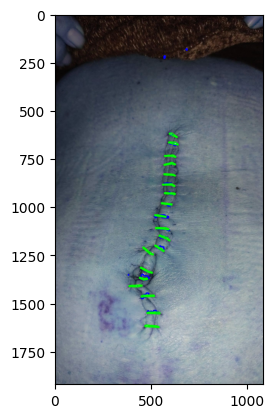

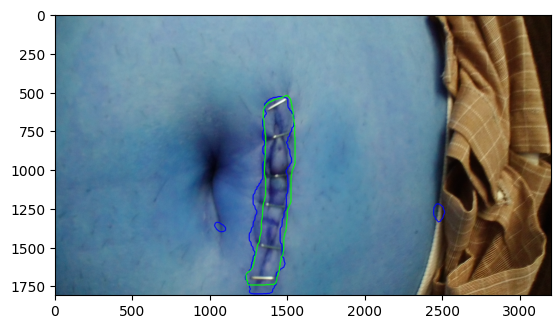

...

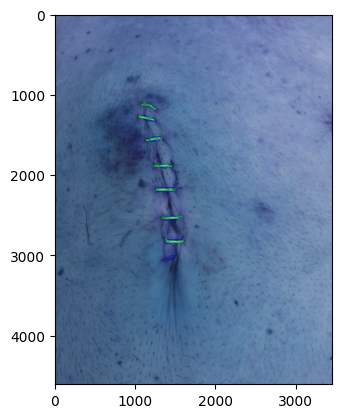

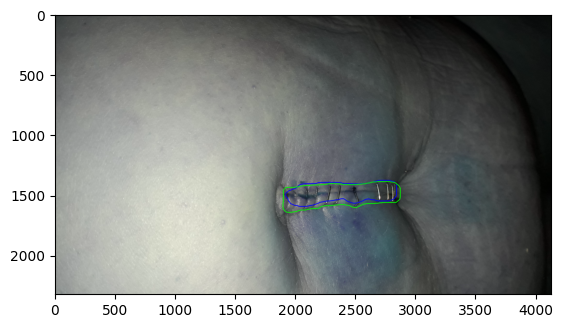

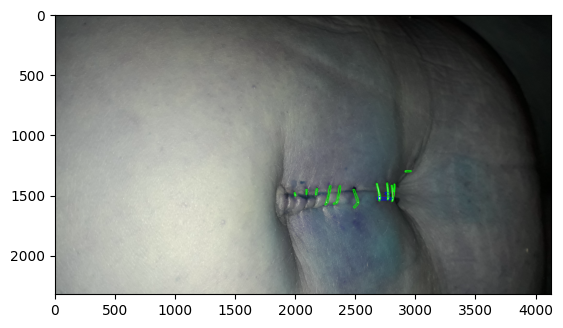

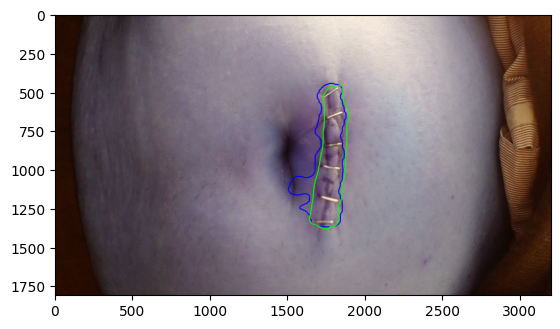

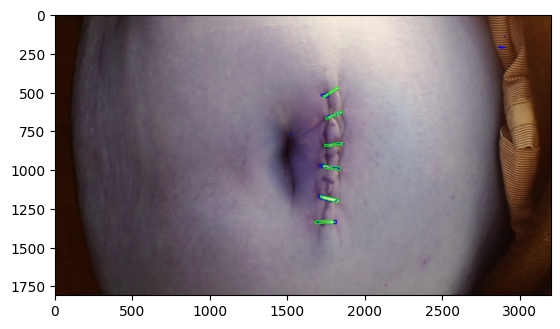

In [27]:
REDSCAR_DATASET = "/home/marc/UIB_EXPERIMENTS/REDSCAR"
REDSCAR_DATASET_TEST = os.path.join(REDSCAR_DATASET, "SUBSETS", "MACHINE_LEARNING_DATASET", "test")
ruta_imatge = os.path.join(REDSCAR_DATASET_TEST,'IMAGES')
ruta_gt_f = os.path.join(REDSCAR_DATASET_TEST,'GT_WOUND_MASK')
ruta_gt_g = os.path.join(REDSCAR_DATASET_TEST,'GT_STAPLES_MASK')
ruta_imatge = os.path.join(REDSCAR_DATASET_TEST,'IMAGES')
rutes_gt = [ruta_gt_f, ruta_gt_g]

ruta_millors = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment02/alta_resolucio_10_millors'
# guardam les millors
visualitzacions(model=gsc, noms_imatges=nom_millors, ruta_imatges=ruta_imatge, rutes_gt=rutes_gt, input_size=256, ruta_guardar = ruta_millors, titol="millor")


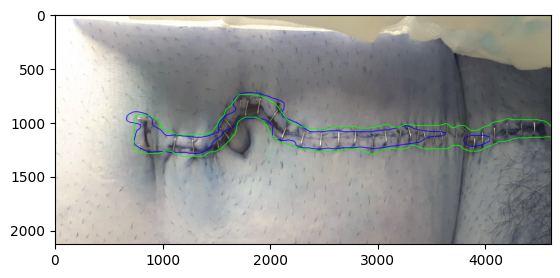

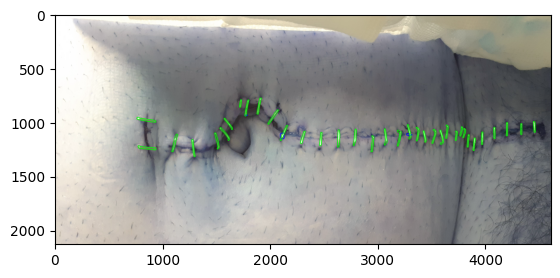

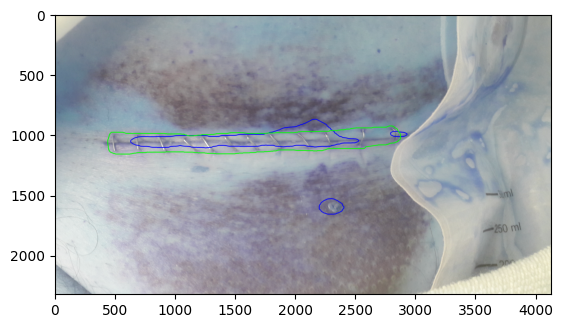

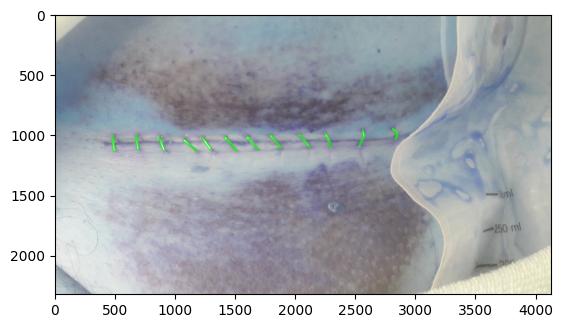

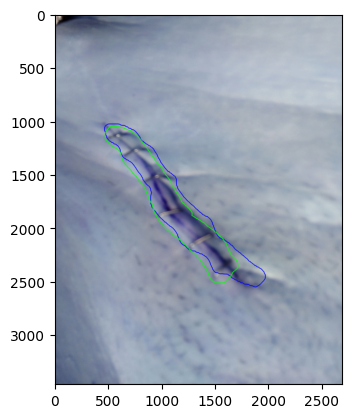

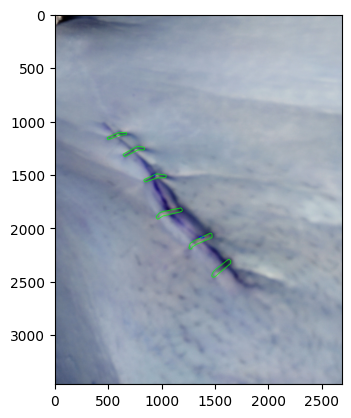

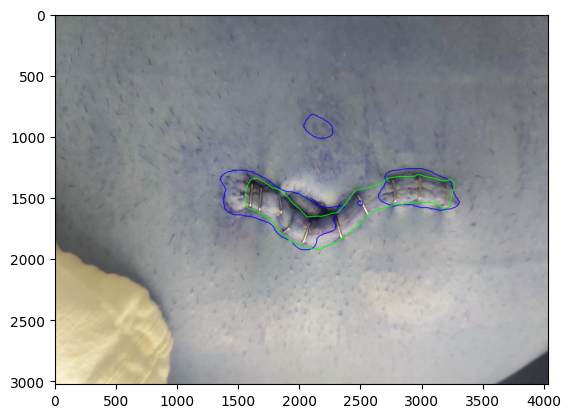

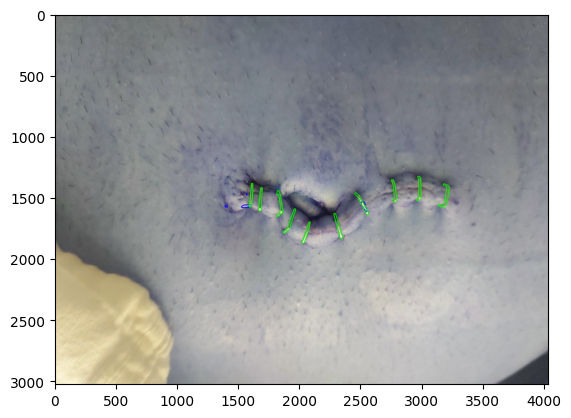

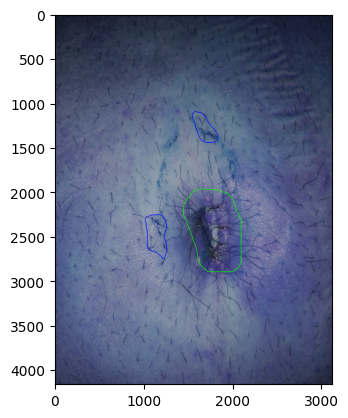

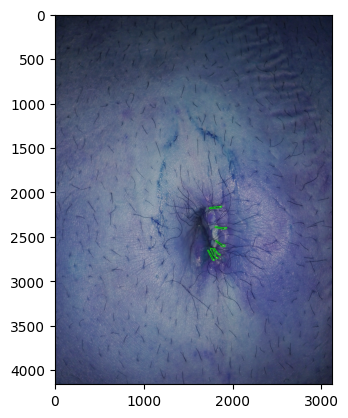

In [28]:
ruta_pitjors = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment02/alta_resolucio_5_pitjors'
# guardam les millors
visualitzacions(model=gsc, noms_imatges=nom_pitjors, ruta_imatges=ruta_imatge, rutes_gt=rutes_gt, input_size=256, ruta_guardar = ruta_millors, titol="pitjor")


## Filtratge 2: millors i pitjors imatges de baixa resolució

In [29]:
# filtram les imatges d'alta resolució -> df2:
df2 = df[df['NOM'].str.endswith('resolution=0.png')]

# eliminam les que NO tenen cap grapa
noms_sense = ['BSmmQo7gZrySCxbaqbqcUrv2F_infection=0_capture=1_resolution=0.png',
             'fEMdP896R7Ns2a6mtbb0uGbpT_infection=0_capture=1_resolution=0.png',
             'YH30nPmh3tokV3aNsPNrFNtpt_infection=0_capture=1_resolution=0.png',
             'fgXrcZ3JaNWgGsJWrjpt8kTi8_infection=0_capture=1_resolution=0.png',
             '2XKzbg86QY1lzFzF6xyk8r49M_infection=0_capture=1_resolution=0.png']
df2 = df2[~df2['NOM'].isin(noms_sense)].reset_index(drop=True)

# l'ordenam en funció del coeficient dice
df2_sorted = df2.sort_values(by='DICE_mean',ascending=False).reset_index(drop=True)# ordenem el df de major a menor coef. de dice
                                                       # per a accedir més fàcilment a les imatges que volem seleccionar

print(df2_sorted)

                                                  NOM    DICE_f  JACCARD_f  \
0   WwaDRJJxLPNttOx9plemyMDnn_infection=0_capture=...  0.885150   0.793963   
1   VScErulur3Ws9LwjEl8EwyZWJ_infection=0_capture=...  0.901970   0.821444   
2   SqzMLLMyU4icHeeVFWe5FAuGb_infection=0_capture=...  0.848959   0.737557   
3   XIIlLL72NJGmdAye6jDJ5O9af_infection=0_capture=...  0.887145   0.797179   
4   tSBNbbT8NVk7wj1KEn5UVHOtU_infection=0_capture=...  0.871604   0.772427   
5   Q8Gc67NrWWZCNTJ39HMHWPvoj_infection=0_capture=...  0.866513   0.764466   
6   7PsK2pKVrkofRQKGB6yIyAmqv_infection=0_capture=...  0.830357   0.709924   
7   bY4zWtNYXKhaPtnFwqWasgLax_infection=0_capture=...  0.843920   0.729984   
8   xFxXLXh7O8elpSiHESB8UzHt7_infection=0_capture=...  0.893739   0.807891   
9   FkjbaDe3x5vbXR5g1eAR4jhQM_infection=0_capture=...  0.915865   0.844789   
10  89Cmrsk0up7FIc0NwQcL5vvwS_infection=0_capture=...  0.915200   0.843657   
11  P7ko6al1C04gK6LG4DYe7jIzs_infection=1_capture=...  0.899960 

In [30]:
nom_tots = []
dice_tots = []

# seleccionam les 10 millors
nom_millors = []
for i in range(10):
    nom = df2_sorted.loc[i,"NOM"]
    nom_millors.append(nom)
    nom_tots.append(nom)
    dice_tots.append(df2_sorted.loc[i,"DICE_mean"])
    
# seleccionam les 5 pitjors
nom_pitjors = []
n = df2_sorted.shape[0]
# iteram a les 5 darreres files
for i in range(n-5,n):
    nom = df2_sorted.loc[i,"NOM"]
    dice_value = df2_sorted.loc[i,"DICE_mean"]
    nom_pitjors.append(nom)
    nom_tots.append(nom)
    dice_tots.append(dice_value)
#print(nom_millors)
print(nom_tots) 
print(dice_tots)
resultats_gsc_baixa = pd.DataFrame({'NOM':nom_tots, 'DICE':dice_tots})
# el guardam com un arxiu .csv en la carpeta resultats
RESULTATS_PATH = '/home/marc/ANGELS_EXPERIMENTS/Results/Experiment28/gsc_multitasca_resultats_baixa.csv'
resultats_gsc_baixa.to_csv(RESULTATS_PATH, index=False)


['WwaDRJJxLPNttOx9plemyMDnn_infection=0_capture=1_resolution=0.png', 'VScErulur3Ws9LwjEl8EwyZWJ_infection=0_capture=1_resolution=0.png', 'SqzMLLMyU4icHeeVFWe5FAuGb_infection=0_capture=1_resolution=0.png', 'XIIlLL72NJGmdAye6jDJ5O9af_infection=0_capture=1_resolution=0.png', 'tSBNbbT8NVk7wj1KEn5UVHOtU_infection=0_capture=1_resolution=0.png', 'Q8Gc67NrWWZCNTJ39HMHWPvoj_infection=0_capture=1_resolution=0.png', '7PsK2pKVrkofRQKGB6yIyAmqv_infection=0_capture=1_resolution=0.png', 'bY4zWtNYXKhaPtnFwqWasgLax_infection=0_capture=1_resolution=0.png', 'xFxXLXh7O8elpSiHESB8UzHt7_infection=0_capture=1_resolution=0.png', 'FkjbaDe3x5vbXR5g1eAR4jhQM_infection=0_capture=1_resolution=0.png', 'YOULiKbLwHcWeuym2NtdlLwIH_infection=0_capture=1_resolution=0.png', 'lXUPm0S7MRanEat4WgprkGHDL_infection=0_capture=1_resolution=0.png', 'hUr4L8D2AxOB7sBbzZsInBEHl_infection=0_capture=1_resolution=0.png', 'Nnq9VMIujxGziNrbm89UxZ6SK_infection=0_capture=1_resolution=0.png', 'cTiK8ZgzLbF0IPJCdOmxdRieJ_infection=0_capture=

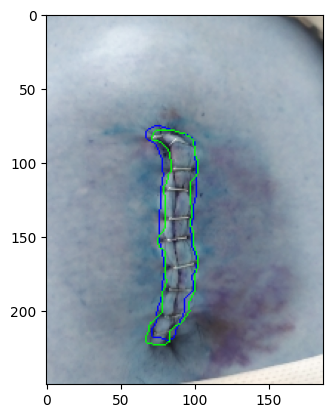

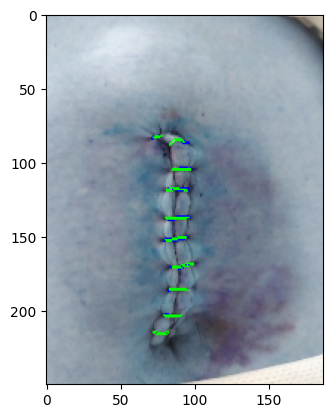

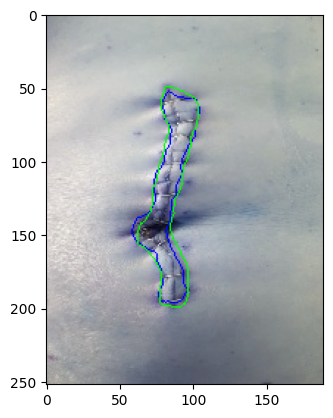

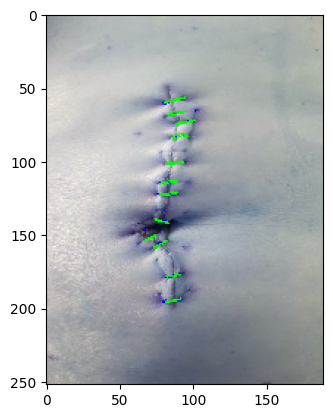

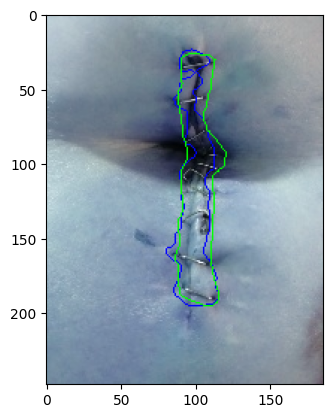

...

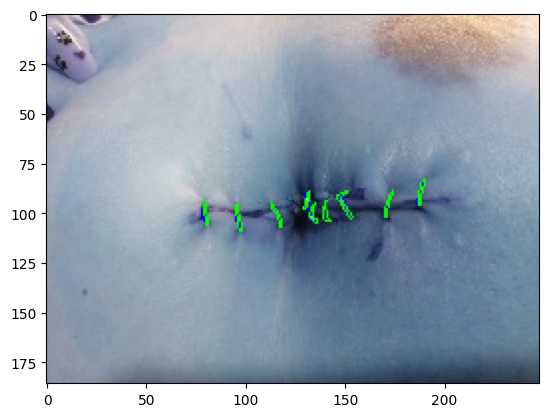

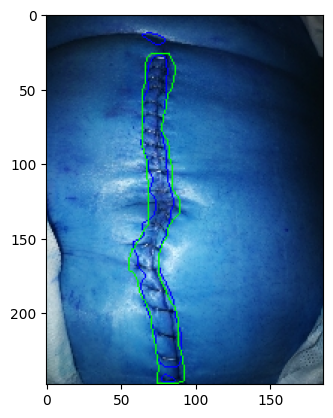

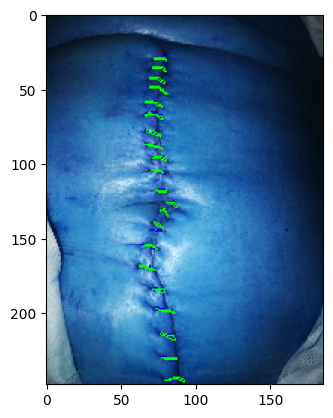

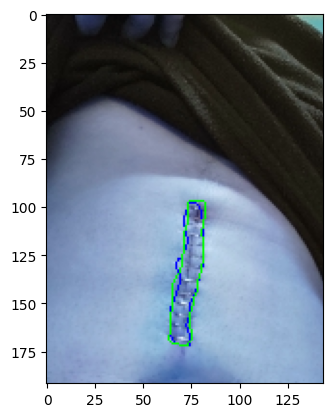

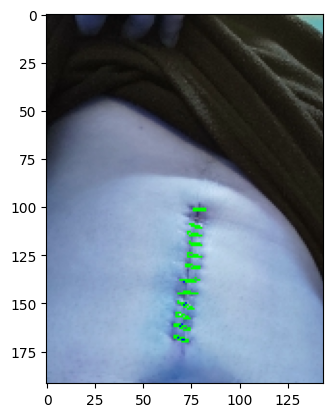

In [34]:
ruta_millors = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment02/baixa_resolucio_10_millors'
# guardam les millors
visualitzacions(model=gsc, noms_imatges=nom_millors, ruta_imatges=ruta_imatge, rutes_gt=rutes_gt, input_size=256, ruta_guardar = ruta_millors, titol="millor")


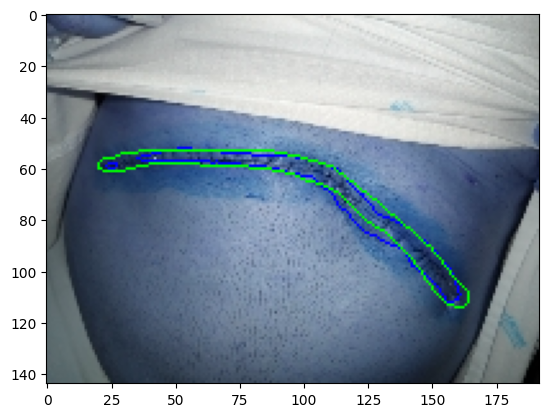

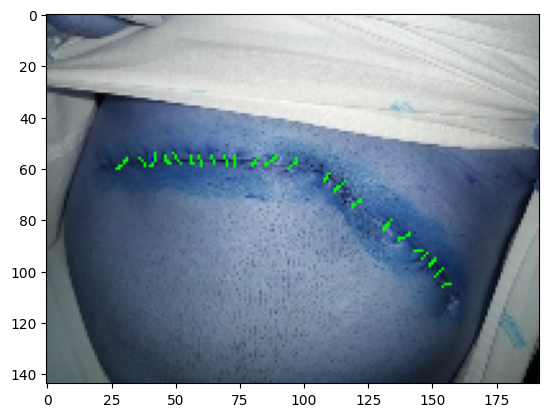

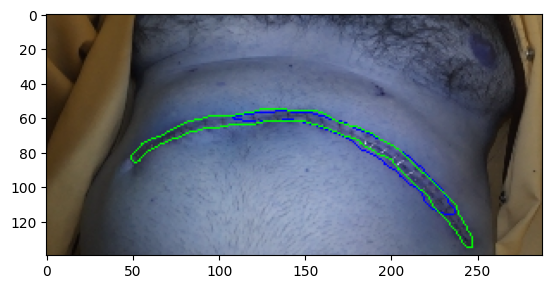

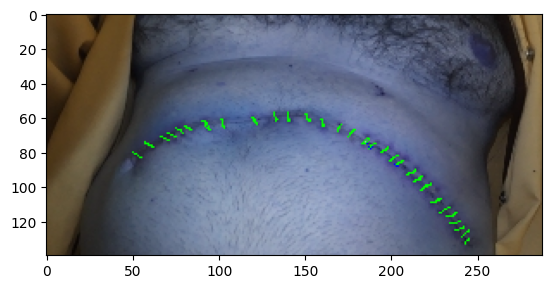

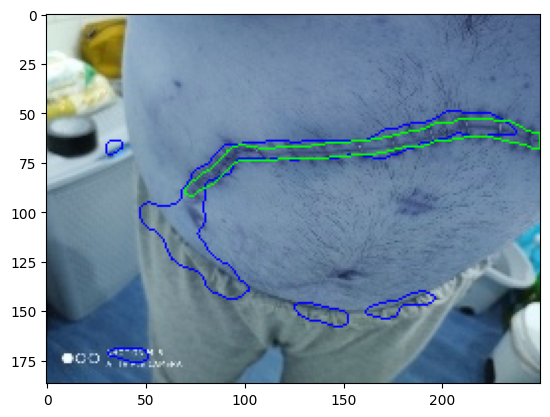

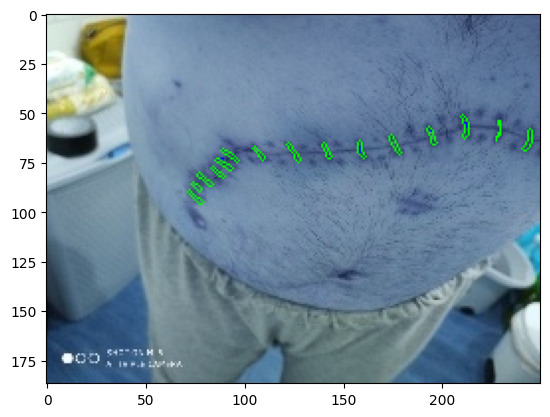

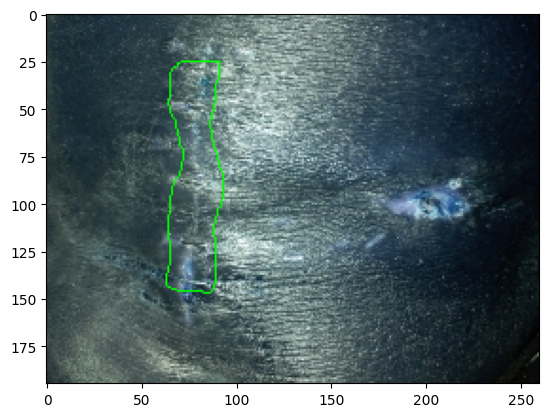

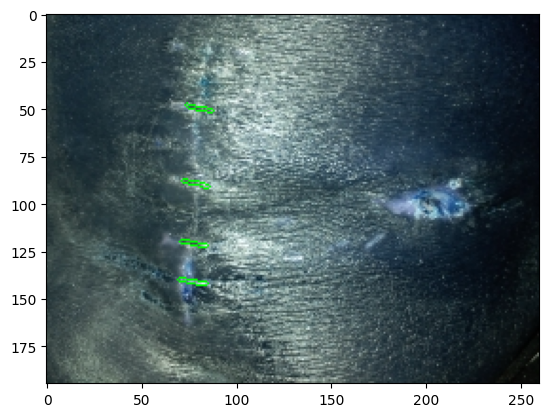

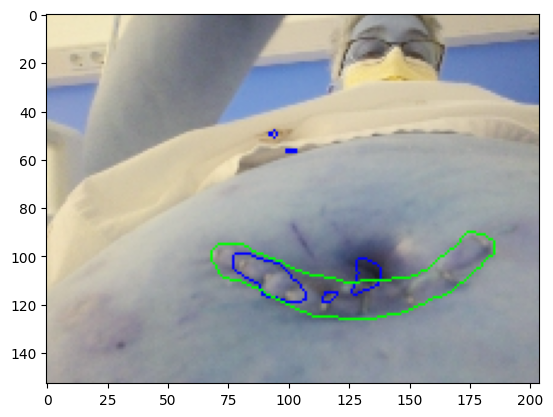

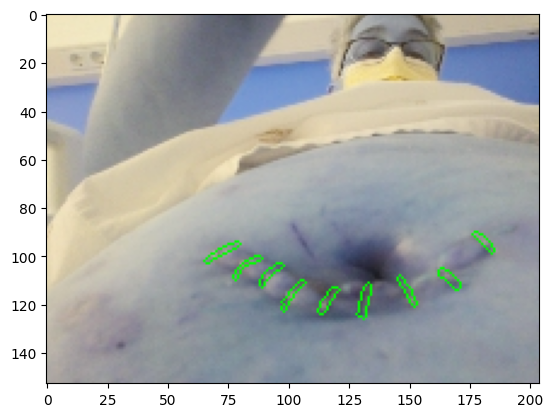

In [35]:
ruta_pitjors = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment02/baixa_resolucio_5_pitjors'
# guardam les millors
visualitzacions(model=gsc, noms_imatges=nom_pitjors, ruta_imatges=ruta_imatge, rutes_gt=rutes_gt, input_size=256, ruta_guardar = ruta_millors, titol="pitjor")
